<a href="https://colab.research.google.com/github/Nils1511/ImageProcessing/blob/main/IP_Assignment1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 1. Read a color image of your own in jpg format, display it, and print its shape. Comment on what the dimensions correspond to

In [ ]:
#mounting drive
from google.colab import drive
drive.mount("/content/gdrive")

In [ ]:
# import required libraries
import cv2
from copy import deepcopy

In [ ]:
# Reading image
img = cv2.imread('/content/gdrive/MyDrive/1test.jpg', cv2.IMREAD_COLOR)

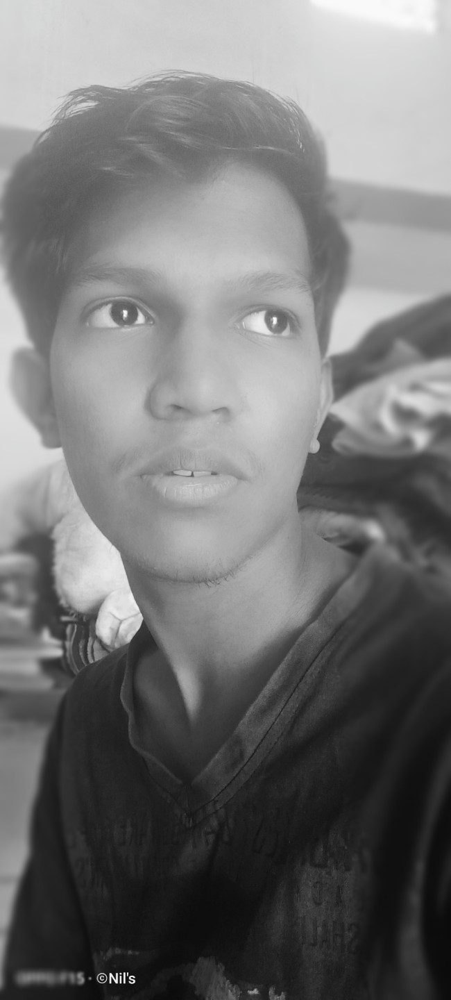

In [ ]:
# library for image show
from google.colab.patches import cv2_imshow
cv2_imshow(img)

In [ ]:
print(img.shape)

(1440, 650, 3)


Tuples of Height,Tuples of Width , No. of channels

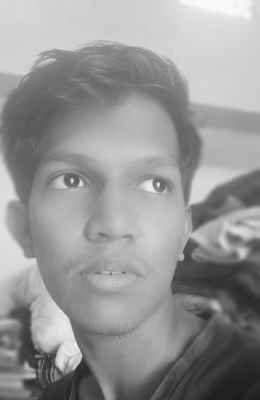

In [ ]:
scale_percent = 40 # percent of original size
width = int(img.shape[1] * scale_percent / 100) # width scale
height = int(img.shape[0] * scale_percent / 100) # height scale
dim = (width, height)

res_img = cv2.resize(img, dim, interpolation = cv2.INTER_AREA) # resizing image
cv2_imshow(res_img[0:400, 0:270, :])  #show cropped image of required portion from resized image


## 2. Print the pixel intensities of a small section of the main image, check how various ranges are addressed, and comment on where the origin of the image is

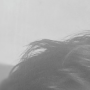

In [ ]:
# take a small portion of image from resized image
image= deepcopy(res_img[10:100,10:100, :])
cv2_imshow(image)            

In [ ]:
print(image.shape) # Tuple of Rows, Tuple of Columns, Channels(RGB)
print(image) # printing pixel intensities value in r,g,b 

(90, 90, 3)
[[[212 212 212]
  [212 212 212]
  [212 212 212]
  ...
  [206 206 206]
  [206 206 206]
  [206 206 206]]

 [[212 212 212]
  [212 212 212]
  [212 212 212]
  ...
  [207 207 207]
  [206 206 206]
  [206 206 206]]

 [[212 212 212]
  [212 212 212]
  [212 212 212]
  ...
  [208 208 208]
  [207 207 207]
  [206 206 206]]

 ...

 [[121 121 121]
  [118 118 118]
  [115 115 115]
  ...
  [127 127 127]
  [124 124 124]
  [124 124 124]]

 [[118 118 118]
  [115 115 115]
  [113 113 113]
  ...
  [125 125 125]
  [126 126 126]
  [126 126 126]]

 [[116 116 116]
  [113 113 113]
  [111 111 111]
  ...
  [123 123 123]
  [124 124 124]
  [127 127 127]]]


Origin is at left most above corner of image

## 3. Overwrite the values in the small window with 255 and display the new imag


In [ ]:
image = deepcopy(res_img[0:400, 0:260, :])

In [ ]:
# intensity of small window is 255 in original image
for i in range(10, 100):
    for j in range(10, 100):
            image[i,j]=255

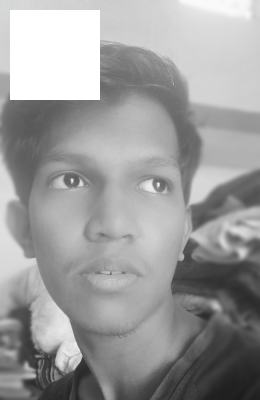

In [ ]:
cv2_imshow(image)

## 4. Overwrite the values in the small window with 256 and display the new imag

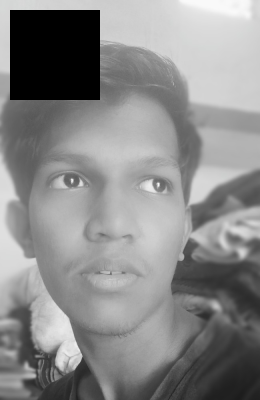

In [ ]:
# intensity of small window is 256 in original image
res = deepcopy(res_img[0:400, 0:260])
for i in range(10, 100):
    for j in range(10, 100):
            res[i,j]=256

cv2_imshow(res)

## 5. Crop a margin of a few pixels from all four sides and store the cropped image in a new image array, and display the cropped image

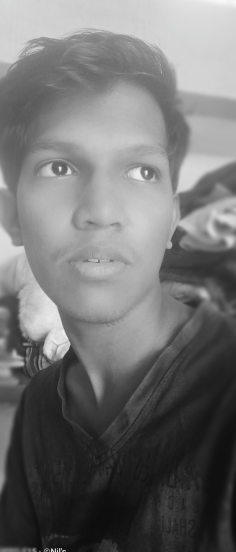

In [ ]:
cropped_image = res_img[12:564, 12:248, :] # crop of margin 12 from all sides from resized image 
cv2_imshow(cropped_image)

## 6.Save it as a new image file in png format.

In [ ]:
cv2.imwrite('/content/gdrive/MyDrive/1.png',cropped_image)


True

## 7.Add 50 to all the pixel values of the original image, display the new image and comment on the results. 

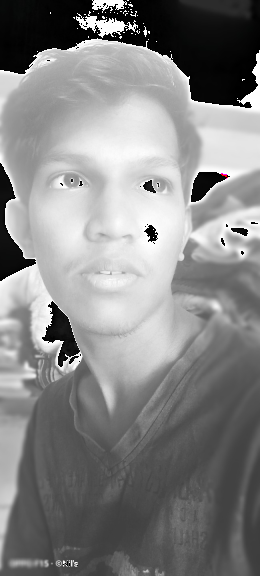

In [ ]:
# Adding 50 to all pixel values
img = deepcopy(res_img)
for i in range(0, img.shape[0]):
    for j in range(0, img.shape[1]):
            img[i,j]+=50

cv2_imshow(img)

***When intensity value goes greater than 255 then new intensity value = intensity value - 255***

## 8. Invert the y-axis to create a mirror image and display it

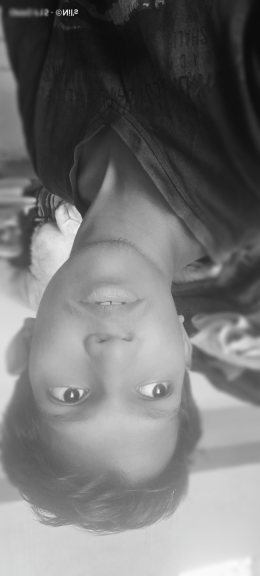

In [ ]:
# flip using ovencv function 
vertical_flip = cv2.flip(res_img,0) 
cv2_imshow(vertical_flip)  

## 9. Take a night shot of your own, convert it to greyscale, and display its histogram. 

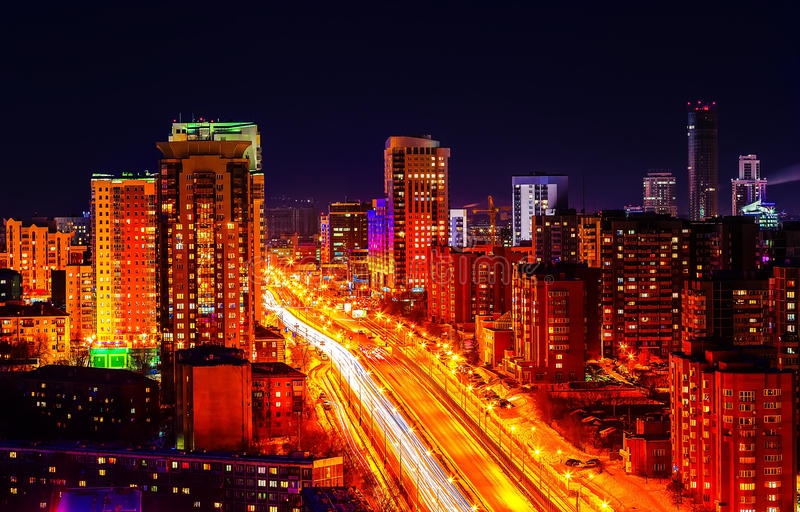

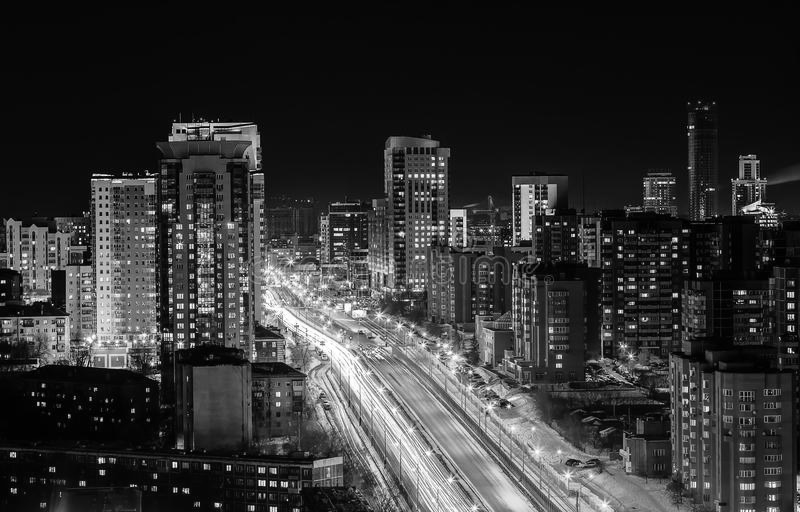

In [ ]:
#Reading an image
img1 = cv2.imread('/content/gdrive/MyDrive/big-city-night-view-top-dusk-67552498.jpg',cv2.IMREAD_COLOR)
# converting into grayscale
gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY) 
cv2_imshow(img1)
cv2_imshow(gray)

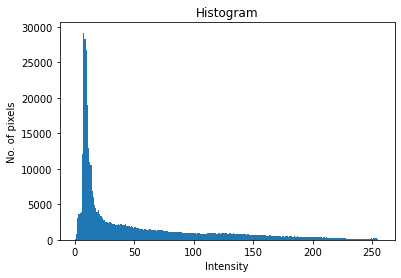

In [ ]:
from matplotlib import pyplot as plt # import library
plt.hist(gray.ravel(),256,[0,256])  # bins will have 257 elements, because Numpy calculates bins as 0-0.99, 1-1.99, 2-2.99 etc. So final range would be 255-255.99
plt.title('Histogram')
plt.ylabel('No. of pixels')
plt.xlabel('Intensity')
plt.show()

## 10. Brighten the image by multiplying pixel values with a>1, and find a good value of a

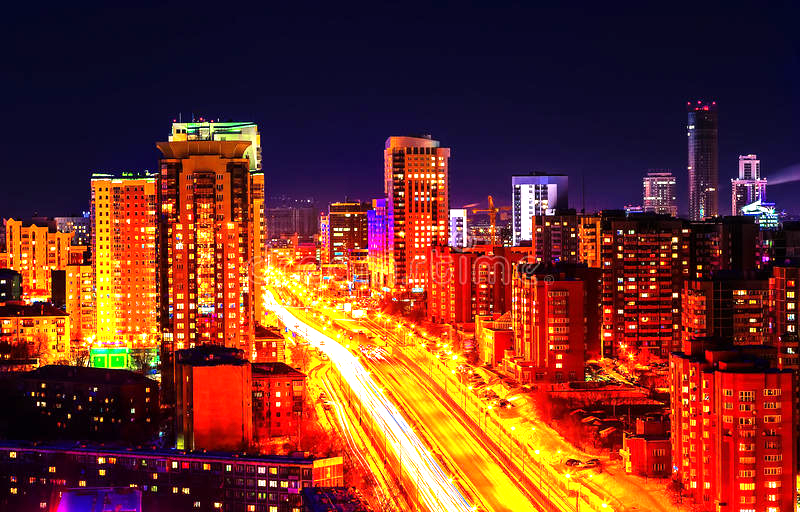

In [ ]:
a = 1.5        # brightness_coefficient
new_image = deepcopy(img1 * a)
cv2_imshow(new_image)

## 11. Try to enhance it using power transform, display results for different gammas, and find the best (subjective) gamma.

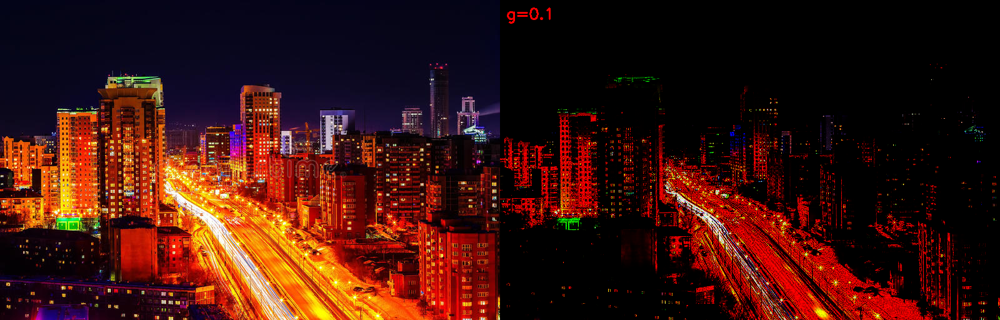

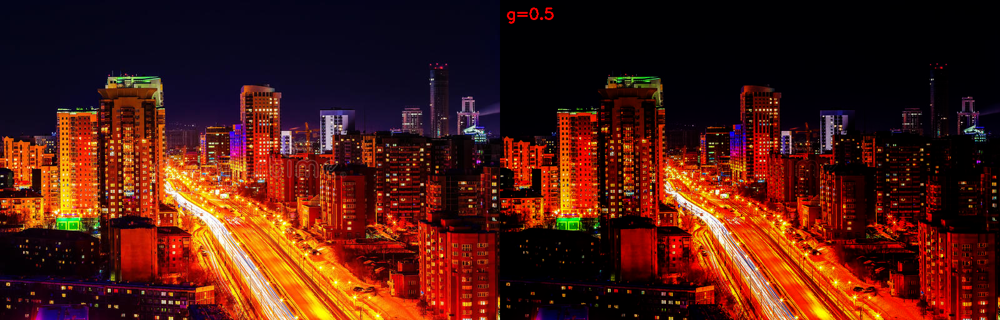

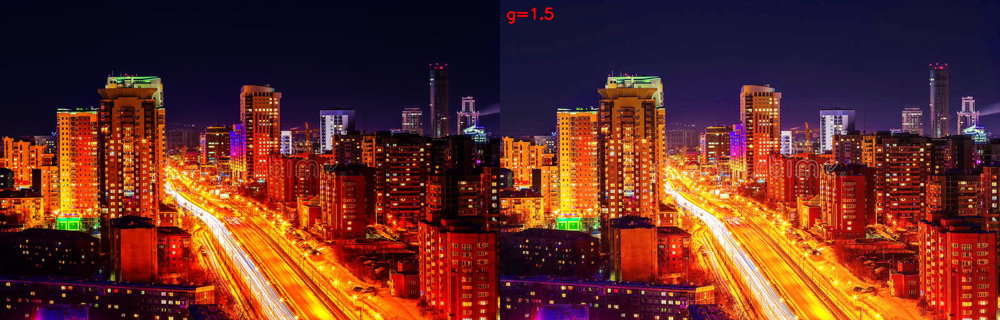

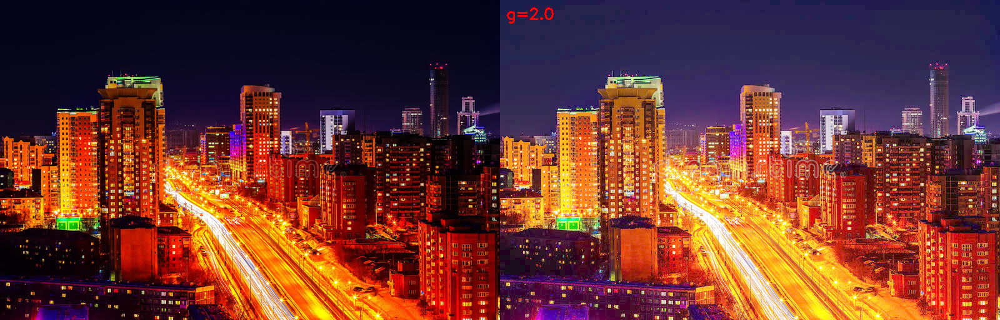

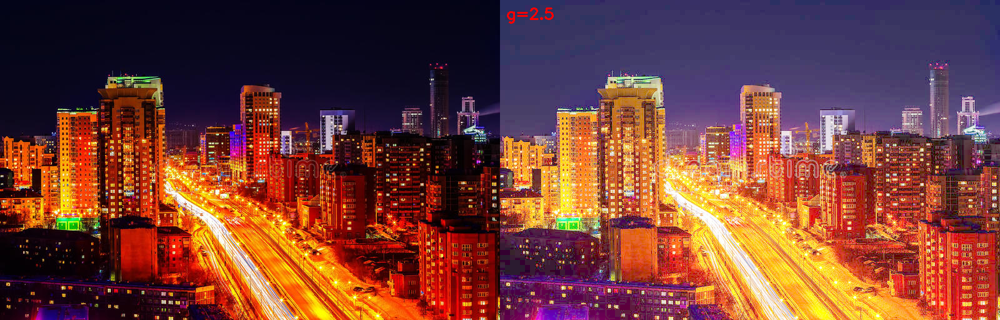

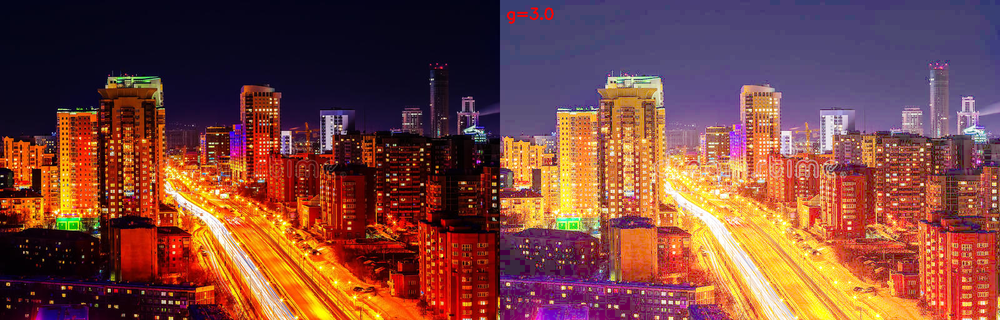

In [ ]:
import numpy as np
def adjust_gamma(image, gamma=1.0):
	# build a lookup table mapping the pixel values [0, 255] to
	# their adjusted gamma values
	invGamma =  1.0/gamma
	table = np.array([((i / 255.0) ** invGamma) * 255
		for i in np.arange(0, 256)]).astype("uint8")
	
	#gamma adjustment. convert image using LUT table. It maps the pixel intensities in the input to the output using values from lookup table
	return cv2.LUT(image, table)


# loop over various values of gamma
for gamma in np.arange(0.0, 3.5, 0.5):

	# ignore when gamma is 1 (there will be no change to the image)
	if gamma == 1:
		continue

	# apply gamma correction 
	gamma = gamma if gamma > 0 else 0.1
	adjusted = adjust_gamma(img1, gamma=gamma)
 
  # ( image, text, org, font, fontScale, color, thickness )
	cv2.putText(adjusted, "g={}".format(gamma), (10, 30),  
		cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 0, 255), 2)  

 #show original and adjusted image side by side
	cv2_imshow( np.hstack([img1, adjusted]))  
	cv2.waitKey(0)

***Best gamma is 1.5***

## 12. Perform histogram equalization to enhance it and display the histogram. Comment on why the histogram is not flat. 

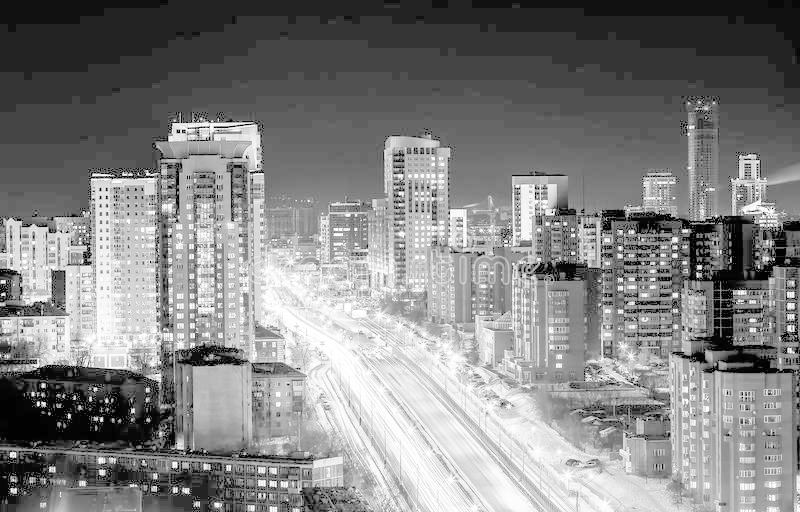

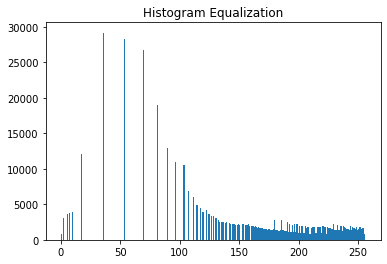

In [ ]:
dst = cv2.equalizeHist(gray )    # opencv library function for histogram equalization
cv2_imshow(dst)
plt.hist(dst.ravel(),256,[0,256])   # bins will have 257 elements, because Numpy calculates bins as 0-0.99, 1-1.99, 2-2.99 etc. So final range would be 255-255.99
plt.title('Histogram Equalization')
plt.show()

## 13. Think of a good target histogram and do histogram specification (histogram matching)

No of Channel is: 3
No of Channel is: 3


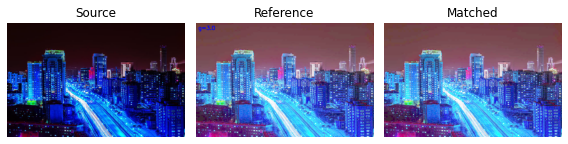

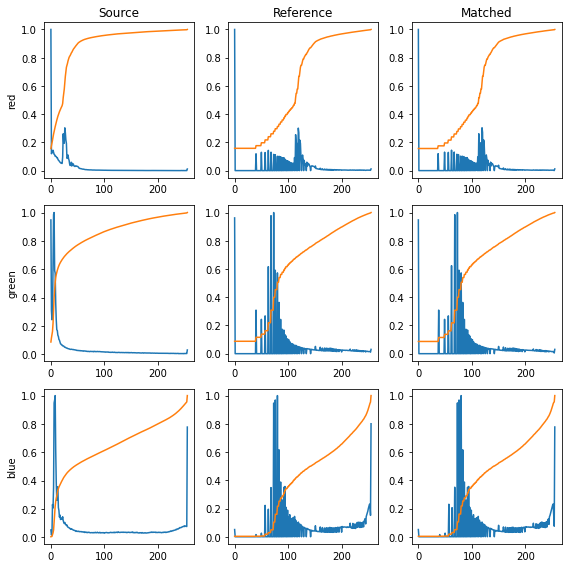

In [ ]:
# code copied from geeksforgeeks and modify it to my convenience 

# import packages
import matplotlib.pyplot as plt
from skimage import exposure
from skimage.exposure import match_histograms
import cv2

# reading reference image
img2 = adjusted # gamma = 3

# checking the number of channels
print('No of Channel is: ' + str(img2.ndim))

image = img1 # original image

# checking the number of channels
print('No of Channel is: ' + str(img1.ndim))
reference = img2

matched = match_histograms(image, reference , multichannel=True)   # Matching the histograms with no. of dimensions matching

fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3,
									figsize=(8, 3),
									sharex=True, sharey=True)

for aa in (ax1, ax2, ax3):
	aa.set_axis_off()

ax1.imshow(image)
ax1.set_title('Source')
ax2.imshow(reference)
ax2.set_title('Reference')
ax3.imshow(matched)
ax3.set_title('Matched')

plt.tight_layout()
plt.show()

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(8, 8))

for i, img in enumerate((image, reference, matched)):
	for c, c_color in enumerate(('red', 'green', 'blue')):
		img_hist, bins = exposure.histogram(img[..., c],
											source_range='dtype')
		axes[c, i].plot(bins, img_hist / img_hist.max())
		img_cdf, bins = exposure.cumulative_distribution(img[..., c])
		axes[c, i].plot(bins, img_cdf)
		axes[c, 0].set_ylabel(c_color)

axes[0, 0].set_title('Source')
axes[0, 1].set_title('Reference')
axes[0, 2].set_title('Matched')

plt.tight_layout()
plt.show()


Sources:
1. Open CV Documentation
2. Geeks for Geeks
3. w3schools.com for matplot
4. computer vision by anish